# 02 — Generate `M_gt` from original Stanford Cars using SAM2

Notebook này chạy trên **dataset gốc Stanford Cars** (train/test), không dùng synthetic ở bước này.

**Pipeline:**
```
cars_train/cars_test (ảnh gốc)
      │
      ├── bbox từ cars_train_annos.mat / cars_test_annos.mat
      │
      ├── resize ảnh về 512×512 + transform bbox tương ứng
      │
      └── SAM2 (bbox prompt) -> chọn mask tốt nhất -> postprocess
                           │
                           ├── x_gt_clean_512/{train|test}_xxxxx.jpg
                           ├── M_gt_512/{train|test}_xxxxx.png
                           └── metadata_clean.csv
```

**Mục tiêu:** tạo `M_gt` cùng hệ tọa độ với `x_gt_clean_512`, để notebook tạo occlusion dùng lại trực tiếp.

## Cell 1 — Cài đặt

In [1]:
import subprocess, sys

def run(cmd, label=''):
    print(f'[{label or cmd[:60]}]')
    r = subprocess.run(cmd, shell=True, capture_output=True, text=True)
    if r.returncode != 0:
        print('STDERR:', r.stderr[-1500:])
    else:
        print('OK')

# 1. SAM 2 (Meta)
run('pip install -q git+https://github.com/facebookresearch/sam2.git', 'SAM 2')

# 2. Utilities
run('pip install -q scipy scikit-image supervision', 'scipy/skimage/supervision')

print('\n✅ Dependencies đã sẵn sàng')

[SAM 2]
OK
[scipy/skimage/supervision]
OK

✅ Dependencies đã sẵn sàng


## Cell 2 — Download checkpoints

In [2]:
import os
from pathlib import Path

CKPT_DIR = Path('/kaggle/working/checkpoints')
CKPT_DIR.mkdir(parents=True, exist_ok=True)

# ── SAM 2 checkpoint ──────────────────────────────────────────────────────────
SAM2_CKPT = CKPT_DIR / 'sam2_hiera_large.pt'
if not SAM2_CKPT.exists():
    print('Downloading SAM 2 large (~900MB)...')
    os.system(
        f'wget -q --show-progress '
        f'https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_large.pt '
        f'-O {SAM2_CKPT}'
    )
else:
    print(f'✅ SAM 2 checkpoint: {SAM2_CKPT}')

print('\n✅ Checkpoint sẵn sàng')


     0K .......... .......... .......... .......... ..........  0% 3.79M 3m46s
    50K .......... .......... .......... .......... ..........  0% 4.92M 3m20s
   100K .......... .......... .......... .......... ..........  0% 14.4M 2m33s
   150K .......... .......... .......... .......... ..........  0% 8.18M 2m21s
   200K .......... .......... .......... .......... ..........  0% 12.3M 2m7s
   250K .......... .......... .......... .......... ..........  0% 23.0M 1m52s
   300K .......... .......... .......... .......... ..........  0% 18.1M 1m43s
   350K .......... .......... .......... .......... ..........  0% 26.5M 94s
   400K .......... .......... .......... .......... ..........  0% 23.0M 88s
   450K .......... .......... .......... .......... ..........  0% 43.0M 81s
   500K .......... .......... .......... .......... ..........  0% 23.2M 77s
   550K .......... .......... .......... .......... ..........  0% 45.4M 72s
   600K .......... .......... .......... .......... ..........


✅ Checkpoint sẵn sàng


........ 98%  151M 0s
861050K .......... .......... .......... .......... .......... 98%  217M 0s
861100K .......... .......... .......... .......... .......... 98%  283M 0s
861150K .......... .......... .......... .......... .......... 98%  221M 0s
861200K .......... .......... .......... .......... .......... 98%  241M 0s
861250K .......... .......... .......... .......... .......... 98%  340M 0s
861300K .......... .......... .......... .......... .......... 98%  201M 0s
861350K .......... .......... .......... .......... .......... 98%  223M 0s
861400K .......... .......... .......... .......... .......... 98%  233M 0s
861450K .......... .......... .......... .......... .......... 98%  220M 0s
861500K .......... .......... .......... .......... .......... 98%  129M 0s
861550K .......... .......... .......... .......... .......... 98%  184M 0s
861600K .......... .......... .......... .......... .......... 98%  196M 0s
861650K .......... .......... .......... .......... .......... 98%

## Cell 3 — Config

In [3]:
from pathlib import Path

# ═══════════════════════════════════════════════════════════════════════════════
# INPUT: Stanford Cars gốc
# ═══════════════════════════════════════════════════════════════════════════════
STANFORD_ROOT    = Path('/kaggle/input/datasets/eduardo4jesus/stanford-cars-dataset')
TRAIN_IMG_DIR    = STANFORD_ROOT / 'cars_train/cars_train'
TEST_IMG_DIR     = STANFORD_ROOT / 'cars_test/cars_test'
TRAIN_ANNO_MAT   = STANFORD_ROOT / 'car_devkit/devkit/cars_train_annos.mat'
TEST_ANNO_MAT    = STANFORD_ROOT / 'car_devkit/devkit/cars_test_annos.mat'

# OUTPUT: dùng cho stage tạo occlusion sau này
OUT_ROOT         = Path('/kaggle/working/stanford_clean')
X_GT_DIR         = OUT_ROOT / 'x_gt_clean_512'
M_GT_DIR         = OUT_ROOT / 'M_gt_512'
VIS_DIR          = OUT_ROOT / 'M_gt_vis'
META_CSV         = OUT_ROOT / 'metadata_clean.csv'

SAM2_CKPT        = Path('/kaggle/working/checkpoints/sam2_hiera_large.pt')
SAM2_CFG         = 'sam2_hiera_l.yaml'
DEVICE           = 'cuda'
TARGET_SIZE      = 512

# Post-processing
FILL_HOLES      = True
MIN_AREA_RATIO  = 0.02

# Visualization
SAVE_VIS        = True
N_VIS           = 100

# ── Tạo thư mục output ────────────────────────────────────────────────────────
OUT_ROOT.mkdir(parents=True, exist_ok=True)
X_GT_DIR.mkdir(parents=True, exist_ok=True)
M_GT_DIR.mkdir(parents=True, exist_ok=True)
VIS_DIR.mkdir(parents=True, exist_ok=True)

print('✅ INPUT')
print('  train images :', TRAIN_IMG_DIR)
print('  test  images :', TEST_IMG_DIR)
print('  train anno   :', TRAIN_ANNO_MAT.exists())
print('  test  anno   :', TEST_ANNO_MAT.exists())
print('✅ OUTPUT')
print('  x_gt_clean_512:', X_GT_DIR)
print('  M_gt_512     :', M_GT_DIR)
print('  metadata     :', META_CSV)

✅ INPUT
  train images : /kaggle/input/datasets/eduardo4jesus/stanford-cars-dataset/cars_train/cars_train
  test  images : /kaggle/input/datasets/eduardo4jesus/stanford-cars-dataset/cars_test/cars_test
  train anno   : True
  test  anno   : True
✅ OUTPUT
  x_gt_clean_512: /kaggle/working/stanford_clean/x_gt_clean_512
  M_gt_512     : /kaggle/working/stanford_clean/M_gt_512
  metadata     : /kaggle/working/stanford_clean/metadata_clean.csv


## Cell 4 — Load annotations + build image list

In [4]:
import torch
import numpy as np
from scipy.io import loadmat

print(f'CUDA: {torch.cuda.is_available()}')
if torch.cuda.is_available():
    print(f'GPU: {torch.cuda.get_device_name(0)}')
    print(f'VRAM: {torch.cuda.get_device_properties(0).total_memory/1e9:.1f} GB')


def _scalar(x):
    return float(np.array(x).squeeze())


def _load_bbox_entries(mat_path, split_name):
    """Return list[dict]: split, file_name, stem, bbox_raw."""
    data = loadmat(str(mat_path))
    annos = data['annotations'][0]
    rows = []
    for a in annos:
        x1 = int(round(_scalar(a[0])))
        y1 = int(round(_scalar(a[1])))
        x2 = int(round(_scalar(a[2])))
        y2 = int(round(_scalar(a[3])))
        name = str(np.array(a[-1]).squeeze())
        stem = Path(name).stem
        rows.append({
            'split': split_name,
            'file_name': name,
            'stem': stem,
            'bbox_raw': (x1, y1, x2, y2),
        })
    return rows


entries = []
entries.extend(_load_bbox_entries(TRAIN_ANNO_MAT, 'train'))
entries.extend(_load_bbox_entries(TEST_ANNO_MAT, 'test'))

print(f'✅ annotation entries: {len(entries):,}')

# Build full image paths
records = []
for e in entries:
    img_dir = TRAIN_IMG_DIR if e['split'] == 'train' else TEST_IMG_DIR
    img_path = img_dir / e['file_name']
    if img_path.exists():
        records.append({**e, 'img_path': img_path})

print(f'✅ image files found: {len(records):,}')
print('sample:', records[0] if records else 'none')

CUDA: True
GPU: Tesla T4
VRAM: 15.6 GB
✅ annotation entries: 16,185
✅ image files found: 16,185
sample: {'split': 'train', 'file_name': '00001.jpg', 'stem': '00001', 'bbox_raw': (39, 116, 569, 375), 'img_path': PosixPath('/kaggle/input/datasets/eduardo4jesus/stanford-cars-dataset/cars_train/cars_train/00001.jpg')}


## Cell 5 — Load SAM 2

In [5]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_model = build_sam2(
    config_file=SAM2_CFG,
    ckpt_path=str(SAM2_CKPT),
    device=DEVICE
)
sam2_predictor = SAM2ImagePredictor(sam2_model)

print(f'✅ SAM 2 ({SAM2_CFG}) loaded trên {DEVICE.upper()}')

✅ SAM 2 (sam2_hiera_l.yaml) loaded trên CUDA


## Cell 6 — Helper functions: select mask + postprocess + visualize

In [6]:
import cv2
import numpy as np
from scipy import ndimage
from skimage import morphology


def select_best_mask(masks: np.ndarray,
                     scores: np.ndarray,
                     bbox: tuple,
                     img_h: int, img_w: int) -> tuple:
    """
    Chọn mask tốt nhất từ candidates của SAM2.

    Lưu ý: tùy version SAM2, dtype của masks có thể là float/uint8/bool,
    nên cần ép về bool trước khi tính toán logic bitwise.
    """
    x1, y1, x2, y2 = bbox
    total_px = max(img_h * img_w, 1)

    # Tạo bbox binary mask để tính IoU
    bbox_mask = np.zeros((img_h, img_w), dtype=bool)
    bbox_mask[y1:y2, x1:x2] = True

    if masks is None or len(masks) == 0:
        return bbox_mask.copy(), 0.0

    # Chuẩn hóa scores
    if scores is None or len(scores) == 0:
        scores = np.zeros((len(masks),), dtype=np.float32)
    scores = np.asarray(scores).reshape(-1)

    combined_scores = []
    masks_bool = []

    for i, mask in enumerate(masks):
        m = np.asarray(mask)
        # Nếu SAM trả logits/float, ngưỡng > 0 là foreground
        if m.dtype != np.bool_:
            m = m > 0
        m = m.astype(bool)
        masks_bool.append(m)

        area_ratio = float(m.sum()) / total_px
        intersection = float((m & bbox_mask).sum())
        union = float((m | bbox_mask).sum())
        iou = intersection / max(union, 1.0)

        score = float(scores[i]) if i < len(scores) else 0.0

        penalty = 0.0
        if area_ratio < 0.03:
            penalty = 0.3
        elif area_ratio > 0.70:
            penalty = 0.2

        combined = 0.6 * score + 0.3 * iou - penalty
        combined_scores.append(combined)

    best_idx = int(np.argmax(combined_scores))
    best_score = float(scores[best_idx]) if best_idx < len(scores) else 0.0
    return masks_bool[best_idx], best_score


def postprocess_mask(mask: np.ndarray,
                     fill_holes: bool = True,
                     min_area_ratio: float = 0.02,
                     smooth_kernel: int = 3) -> np.ndarray:
    """
    Hậu xử lý binary mask:
      1. remove_small_objects  — loại speckles nhiễu nhỏ
      2. binary_fill_holes     — lấp lỗ hổng (kính xe, đèn)
      3. morphological closing — nối các đứt gãy nhỏ ở viền

    Returns: (H, W) uint8, 0 hoặc 255
    """
    mask = mask.astype(bool)
    h, w = mask.shape

    # 1. Remove small objects
    min_px = int(min_area_ratio * h * w)
    mask   = morphology.remove_small_objects(mask, min_size=max(min_px, 64))

    # 2. Fill holes
    if fill_holes:
        mask = ndimage.binary_fill_holes(mask)

    # 3. Smooth viền bằng morphological closing + opening
    if smooth_kernel > 0:
        kernel     = cv2.getStructuringElement(
            cv2.MORPH_ELLIPSE, (smooth_kernel, smooth_kernel))
        mask_u8    = mask.astype(np.uint8) * 255
        mask_u8    = cv2.morphologyEx(mask_u8, cv2.MORPH_CLOSE, kernel)
        mask_u8    = cv2.morphologyEx(mask_u8, cv2.MORPH_OPEN,  kernel)
        mask       = mask_u8 > 127

    return mask.astype(np.uint8) * 255


def make_visualization(img_rgb, mask_raw, mask_clean,
                        bbox, gdino_conf, sam_score):
    """
    Tạo ảnh visualization 3-panel:
    [ảnh gốc + GDINO bbox] | [Raw SAM mask] | [Cleaned M_gt]
    """
    x1, y1, x2, y2 = bbox

    # Panel 1: ảnh + bbox
    p1 = img_rgb.copy()
    cv2.rectangle(p1, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(p1, f'GDino:{gdino_conf:.2f}',
                (x1, max(y1 - 6, 12)),
                cv2.FONT_HERSHEY_SIMPLEX, 0.45, (0, 255, 0), 1)

    # Panel 2: Raw SAM overlay (orange)
    p2  = img_rgb.copy()
    ovl = np.zeros_like(p2)
    ovl[mask_raw > 0] = [255, 120, 0]
    p2  = cv2.addWeighted(p2, 0.55, ovl, 0.45, 0)
    cv2.putText(p2, f'SAM raw  score:{sam_score:.3f}',
                (5, 18), cv2.FONT_HERSHEY_SIMPLEX, 0.45, (255, 255, 255), 1)

    # Panel 3: Cleaned mask overlay (green)
    p3  = img_rgb.copy()
    ovl2 = np.zeros_like(p3)
    ovl2[mask_clean > 0] = [30, 210, 100]
    p3  = cv2.addWeighted(p3, 0.55, ovl2, 0.45, 0)
    cv2.putText(p3, 'M_gt  (cleaned)',
                (5, 18), cv2.FONT_HERSHEY_SIMPLEX, 0.45, (255, 255, 255), 1)

    return np.concatenate([p1, p2, p3], axis=1)


print('✅ Helper functions defined')

✅ Helper functions defined


## Cell 7 — Quick sanity check trên 1 ảnh trước khi chạy toàn bộ

Test ảnh: 00001.jpg | split=train
  RAW bbox: (39, 116, 569, 375) | RESIZED bbox: (33, 148, 486, 480)
  SAM scores: [0.9769 0.976  0.9868]
  Best SAM score: 0.9868
  Mask area: 0.412 (fraction of image)


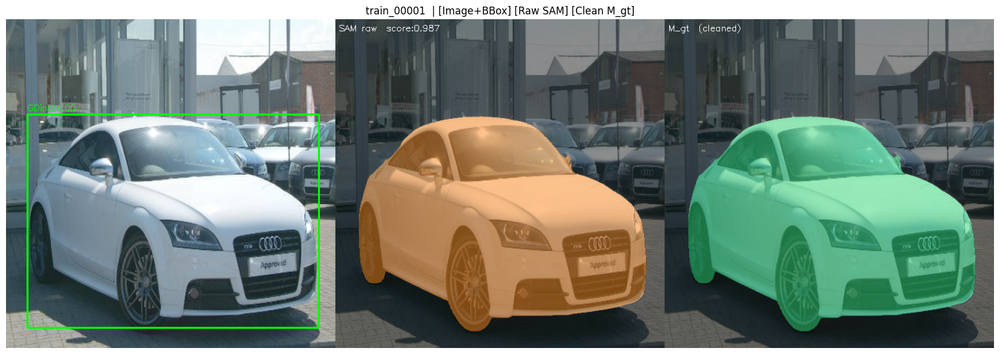


✅ Sanity check OK. Nếu mask ổn, chạy Cell 8.


In [7]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Test bản ghi đầu tiên
test_rec = records[0]
test_path = test_rec['img_path']
bbox_raw = test_rec['bbox_raw']
print(f"Test ảnh: {test_path.name} | split={test_rec['split']}")

img_bgr = cv2.imread(str(test_path))
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
H, W = img_rgb.shape[:2]

# Resize ảnh về 512 và transform bbox tương ứng
img_512 = cv2.resize(img_rgb, (TARGET_SIZE, TARGET_SIZE), interpolation=cv2.INTER_AREA)
sx, sy = TARGET_SIZE / W, TARGET_SIZE / H
x1, y1, x2, y2 = bbox_raw
bbox = (
    int(round(x1 * sx)),
    int(round(y1 * sy)),
    int(round(x2 * sx)),
    int(round(y2 * sy)),
)

print(f'  RAW bbox: {bbox_raw} | RESIZED bbox: {bbox}')

sam2_predictor.set_image(img_512)
masks, scores, _ = sam2_predictor.predict(
    point_coords=None,
    point_labels=None,
    box=np.array(bbox, dtype=np.float32),
    multimask_output=True
)

print(f'  SAM scores: {np.array(scores).round(4)}')

best_mask_bool, best_score = select_best_mask(masks, scores, bbox, TARGET_SIZE, TARGET_SIZE)
raw_mask = best_mask_bool.astype(np.uint8) * 255
clean_mask = postprocess_mask(raw_mask, fill_holes=True, min_area_ratio=0.02)

print(f'  Best SAM score: {best_score:.4f}')
print(f'  Mask area: {(clean_mask > 0).mean():.3f} (fraction of image)')

vis = make_visualization(img_512, raw_mask, clean_mask, bbox, 1.0, best_score)

fig, ax = plt.subplots(1, 1, figsize=(18, 6))
ax.imshow(vis)
ax.set_title(f"{test_rec['split']}_{test_rec['stem']}  | [Image+BBox] [Raw SAM] [Clean M_gt]")
ax.axis('off')
plt.tight_layout()
plt.show()

print('\n✅ Sanity check OK. Nếu mask ổn, chạy Cell 8.')

## Cell 8 — Main loop: Stanford gốc -> x_gt_clean_512 + M_gt_512

In [8]:
import cv2
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

print(f'Tổng records từ annotation: {len(records)}')

# Resume theo stem đã có mask
processed = {p.stem for p in M_GT_DIR.glob('*.png')}
work_items = [r for r in records if f"{r['split']}_{r['stem']}" not in processed]
print(f'Cần xử lý: {len(work_items)} | đã có: {len(processed)}')

rows = []
n_vis = 0
n_fail = 0

for r in tqdm(work_items, desc='SAM2 on Stanford original'):
    split = r['split']
    stem = r['stem']
    out_stem = f'{split}_{stem}'
    img_path = r['img_path']
    x1, y1, x2, y2 = r['bbox_raw']

    try:
        img_bgr = cv2.imread(str(img_path))
        if img_bgr is None:
            raise ValueError(f'cv2.imread failed: {img_path}')
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        H, W = img_rgb.shape[:2]

        # Resize image + transform bbox cùng hệ tọa độ 512
        img_512 = cv2.resize(img_rgb, (TARGET_SIZE, TARGET_SIZE), interpolation=cv2.INTER_AREA)
        sx, sy = TARGET_SIZE / W, TARGET_SIZE / H
        bx1 = int(round(x1 * sx))
        by1 = int(round(y1 * sy))
        bx2 = int(round(x2 * sx))
        by2 = int(round(y2 * sy))
        bx1, by1 = max(0, bx1), max(0, by1)
        bx2, by2 = min(TARGET_SIZE - 1, bx2), min(TARGET_SIZE - 1, by2)
        bbox_512 = (bx1, by1, bx2, by2)

        # SAM2 predict
        sam2_predictor.set_image(img_512)
        masks, scores, _ = sam2_predictor.predict(
            point_coords=None,
            point_labels=None,
            box=np.array(bbox_512, dtype=np.float32),
            multimask_output=True,
        )

        best_mask_bool, sam_score = select_best_mask(
            masks, scores, bbox_512, TARGET_SIZE, TARGET_SIZE
        )
        raw_mask = best_mask_bool.astype(np.uint8) * 255
        mask_clean = postprocess_mask(
            raw_mask,
            fill_holes=FILL_HOLES,
            min_area_ratio=MIN_AREA_RATIO,
            smooth_kernel=3,
        )

        area_ratio = float((mask_clean > 0).sum()) / (TARGET_SIZE * TARGET_SIZE)

        # Save outputs
        cv2.imwrite(str(X_GT_DIR / f'{out_stem}.jpg'), cv2.cvtColor(img_512, cv2.COLOR_RGB2BGR))
        cv2.imwrite(str(M_GT_DIR / f'{out_stem}.png'), mask_clean)

        if SAVE_VIS and n_vis < N_VIS:
            vis = make_visualization(img_512, raw_mask, mask_clean, bbox_512, 1.0, sam_score)
            cv2.imwrite(str(VIS_DIR / f'{out_stem}_vis.jpg'), cv2.cvtColor(vis, cv2.COLOR_RGB2BGR))
            n_vis += 1

        rows.append({
            'split': split,
            'id': stem,
            'stem': out_stem,
            'orig_img_path': str(img_path),
            'x_gt': f'{out_stem}.jpg',
            'm_gt': f'{out_stem}.png',
            'bbox_x1_raw': x1, 'bbox_y1_raw': y1,
            'bbox_x2_raw': x2, 'bbox_y2_raw': y2,
            'bbox_x1_512': bx1, 'bbox_y1_512': by1,
            'bbox_x2_512': bx2, 'bbox_y2_512': by2,
            'sam_score': round(float(sam_score), 4),
            'area_ratio': round(area_ratio, 4),
        })

    except Exception as e:
        n_fail += 1
        print(f"\n❌ {out_stem}: {e}")

# Save metadata
md = pd.DataFrame(rows)
md.to_csv(META_CSV, index=False)

print('\n' + '='*60)
print(f'✅ Done: {len(rows)} | failed: {n_fail}')
print(f'   x_gt_clean_512 -> {X_GT_DIR}')
print(f'   M_gt_512      -> {M_GT_DIR}')
print(f'   metadata      -> {META_CSV}')

Tổng records từ annotation: 16185
Cần xử lý: 16185 | đã có: 0


SAM2 on Stanford original:   0%|          | 0/16185 [00:00<?, ?it/s]


✅ Done: 16185 | failed: 0
   x_gt_clean_512 -> /kaggle/working/stanford_clean/x_gt_clean_512
   M_gt_512      -> /kaggle/working/stanford_clean/M_gt_512
   metadata      -> /kaggle/working/stanford_clean/metadata_clean.csv


## Cell 9 — Quality analysis

═════════════════════════════════════════════
THỐNG KÊ TỔNG QUAN
═════════════════════════════════════════════
Tổng ảnh: 16185
              count unique    top  freq      mean       std     min     25%  \
split         16185      2  train  8144       NaN       NaN     NaN     NaN   
sam_score   16185.0    NaN    NaN   NaN   0.98155  0.020749  0.1824  0.9801   
area_ratio  16185.0    NaN    NaN   NaN  0.372017  0.120872     0.0  0.2877   

               50%     75%     max  
split          NaN     NaN     NaN  
sam_score   0.9849   0.988  0.9953  
area_ratio  0.3658  0.4506     1.0  

⚠️  Cảnh báo:
   SAM score < 0.80: 35 ảnh
   area_ratio < 5% : 12 ảnh
   area_ratio > 80%: 16 ảnh


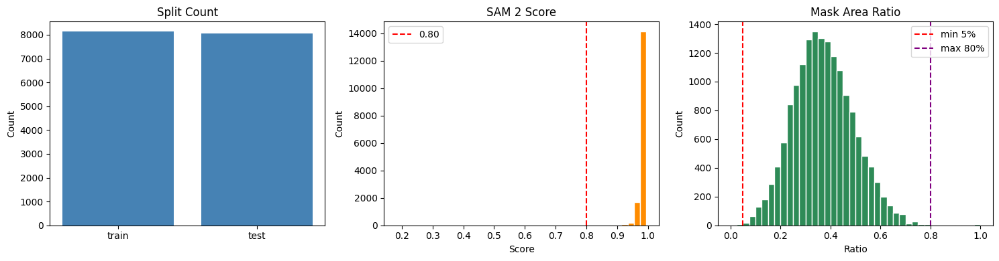

✅ Lưu chart -> /kaggle/working/stanford_clean/Mgt_quality.png


In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

df = pd.read_csv(META_CSV)
print('═'*45)
print('THỐNG KÊ TỔNG QUAN')
print('═'*45)
print(f'Tổng ảnh: {len(df)}')
print(df[['split', 'sam_score', 'area_ratio']].describe(include='all').transpose())

low_score = df[df['sam_score'] < 0.80]
small_mask = df[df['area_ratio'] < 0.05]
large_mask = df[df['area_ratio'] > 0.80]

print('\n⚠️  Cảnh báo:')
print(f'   SAM score < 0.80: {len(low_score)} ảnh')
print(f'   area_ratio < 5% : {len(small_mask)} ảnh')
print(f'   area_ratio > 80%: {len(large_mask)} ảnh')

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

split_counts = df['split'].value_counts()
axes[0].bar(split_counts.index, split_counts.values, color='steelblue')
axes[0].set_title('Split Count')
axes[0].set_ylabel('Count')

axes[1].hist(df['sam_score'], bins=40, color='darkorange', edgecolor='white')
axes[1].axvline(0.80, color='red', linestyle='--', label='0.80')
axes[1].set_title('SAM 2 Score')
axes[1].set_xlabel('Score'); axes[1].set_ylabel('Count')
axes[1].legend()

axes[2].hist(df['area_ratio'], bins=40, color='seagreen', edgecolor='white')
axes[2].axvline(0.05, color='red', linestyle='--', label='min 5%')
axes[2].axvline(0.80, color='purple', linestyle='--', label='max 80%')
axes[2].set_title('Mask Area Ratio')
axes[2].set_xlabel('Ratio'); axes[2].set_ylabel('Count')
axes[2].legend()

plt.tight_layout()
plt.savefig(str(OUT_ROOT / 'Mgt_quality.png'), dpi=120, bbox_inches='tight')
plt.show()
print(f'✅ Lưu chart -> {OUT_ROOT / "Mgt_quality.png"}')

## Cell 10 — Visual inspection (random sample)

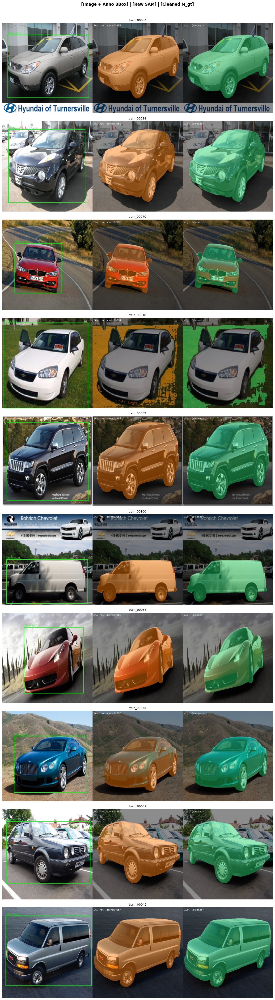

In [10]:
import random, cv2, matplotlib.pyplot as plt
from pathlib import Path

vis_files = sorted(VIS_DIR.glob('*_vis.jpg'))
N_SHOW    = min(10, len(vis_files))
sample    = random.sample(vis_files, N_SHOW)

fig, axes = plt.subplots(N_SHOW, 1, figsize=(18, 4.2 * N_SHOW))
if N_SHOW == 1:
    axes = [axes]

for ax, vp in zip(axes, sample):
    vis = cv2.cvtColor(cv2.imread(str(vp)), cv2.COLOR_BGR2RGB)
    ax.imshow(vis)
    ax.set_title(vp.stem.replace('_vis',''), fontsize=9)
    ax.axis('off')

plt.suptitle('[Image + Anno BBox] | [Raw SAM] | [Cleaned M_gt]',
             fontsize=12, fontweight='bold', y=1.005)
plt.tight_layout()
plt.savefig(str(OUT_ROOT / 'Mgt_inspection.png'), dpi=100, bbox_inches='tight')
plt.show()

## Cell 11 — Next step: tạo synthetic occlusion từ `x_gt_clean_512` + `M_gt_512`

Notebook này kết thúc ở stage tạo dữ liệu sạch:
- `x_gt_clean_512/*.jpg`
- `M_gt_512/*.png`
- `metadata_clean.csv`

Bước tiếp theo (ở notebook occlusion):
1. Dùng `x_gt_clean_512` làm base image.
2. Paste occluder như logic cũ.
3. Tính:
   `occlusion_ratio = |occ_mask ∩ M_gt| / |M_gt|`
4. Lưu `x_occ`, `masks`, metadata theo các bin 20-40/40-60/60-80.

Khi eval segmentation kiểu Yan:
- `M_gt`: từ notebook này.
- `M_hat`: từ `M_gt` trừ vùng occ.
- `M_pred`: mask dự đoán sau completion/refinement.
- Chấm Precision/Recall/F1/IoU/L1/L2 giữa `M_pred` và `M_gt`.